In [1]:
#------------------- Change working directory to project root -------------------#
from pathlib import Path, os

cur = Path().resolve()
while not (cur / "src").is_dir():
    if cur == cur.parent: raise RuntimeError("No 'src' dir")
    cur = cur.parent

os.chdir(cur)
print(f"[INFO] Changed working directory to project root: {cur}")

[INFO] Changed working directory to project root: /home/fernando/Documents/LoRaPriv


In [2]:
# -------------------------------------- External Libraries --------------------------------------
import numpy as np
from datetime import datetime
from typing import Callable
import matplotlib.pyplot as plt
import random
from collections import defaultdict
import time
# ----------------------------------------- Local Imports ----------------------------------------
from src.core                  import LoRaPhyParams, LoRaFrameParams
from src.mod                   import LoRaModulator
from src.demod                 import LoRaDemodulator, plot_demodulation
from src.sync                  import DechirpBasedSynchronizer, plot_synchronization
from src.core.vpn_utils        import VPNKeepAlive

import src.core.sdr_utils as sdr_utils
import src.core.snr_utils as snr_utils
import src.core.perf_metrics_utils as perf_utils
import src.core.misc_utils as misc_utils


In [3]:
list = misc_utils.list_iq_dumps()

• dump_Dual-SDR-Test-Error_20250730-160950.npz       (SF=8, BW=500kHz, SPC=2) [at 16:09]
• dump_Dual-SDR-Test-Error_20250730-160940.npz       (SF=8, BW=500kHz, SPC=2) [at 16:09]
• dump_Dual-SDR-Test-Error_20250730-160916.npz       (SF=8, BW=500kHz, SPC=2) [at 16:09]
• dump_Dual-SDR-Test-Error_20250730-160906.npz       (SF=8, BW=500kHz, SPC=2) [at 16:09]
• dump_Dual-SDR-Test-Error_20250730-160841.npz       (SF=8, BW=500kHz, SPC=2) [at 16:08]
• dump_Dual-SDR-Test-SemiSuccess_20250730-160825.npz (SF=8, BW=500kHz, SPC=2) [at 16:08]


In [4]:
# Carga el iq dump
iq_dump_path = list[-1]
iq_dump = misc_utils.load_iq_dump(iq_dump_path)  

phy_params = iq_dump.phy_params
frame_params = iq_dump.frame_params
payload_syms = iq_dump.payload
print(f"Loaded IQ dump from {iq_dump_path}")
print(f"PHY Params: {phy_params}")
print(f"Frame Params: {frame_params}")
print(f"Payload Symbols: {payload_syms}")

modulator = LoRaModulator(
    phy_params=phy_params,
    frame_params=frame_params)

demodulator = LoRaDemodulator(
    phy_params=phy_params,
    fold_mode="CPA",
)

sync = DechirpBasedSynchronizer(
    phy_params=phy_params,
    frame_params=frame_params,
    fold_mode="CPA",
    max_sync_candidates=10,
    logging=True,
    debug=True
)

[DEBUG] Loaded dump: /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-SemiSuccess_20250730-160825.npz
Loaded IQ dump from /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-SemiSuccess_20250730-160825.npz
PHY Params: LoRaPhyParams(SF=8, BW=500 kHz, SPC=2)
Frame Params: LoRaFrameParams(preamble=8, explicit_header=True, sync_word=0x00, sync_section_length=14.25 symbols)
Payload Symbols: [0, 72, 111, 108, 97, 32, 77, 117, 110, 100, 111]


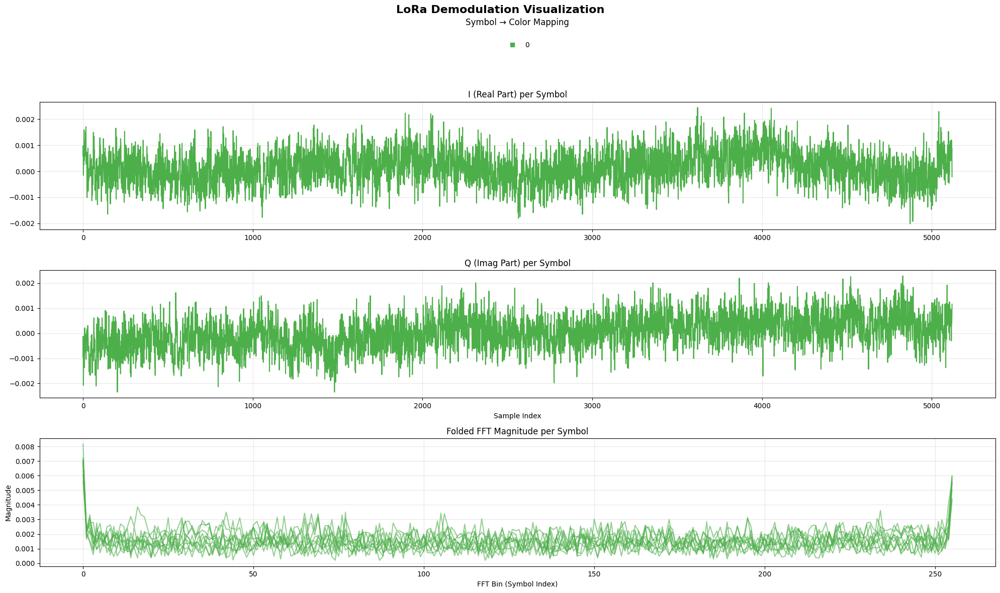

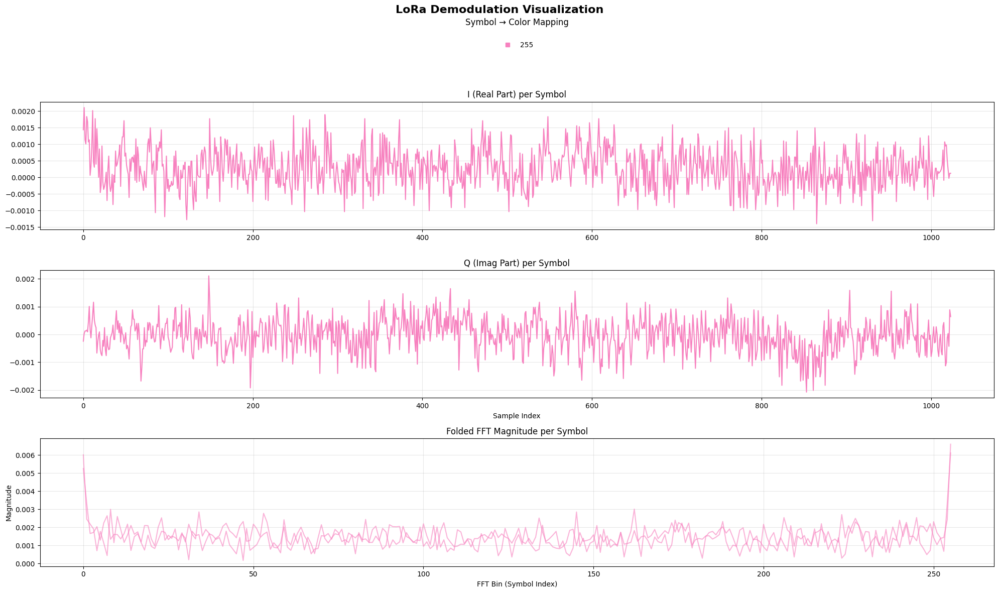

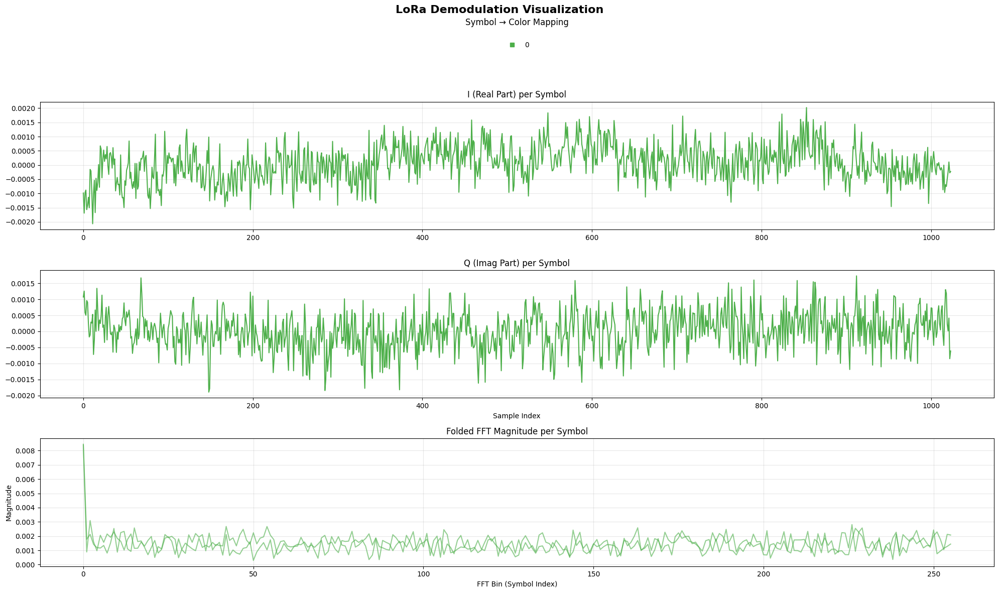

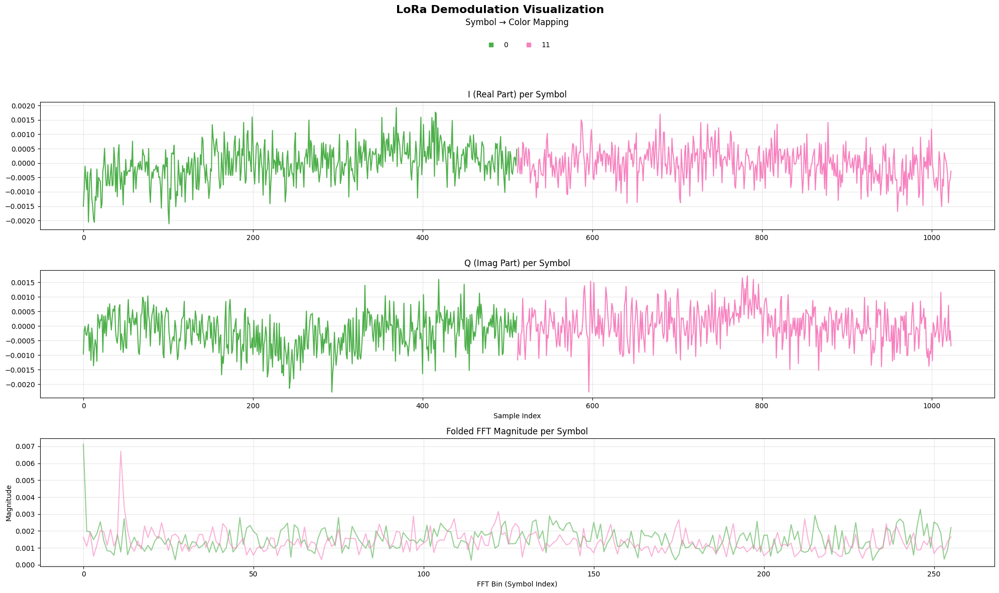

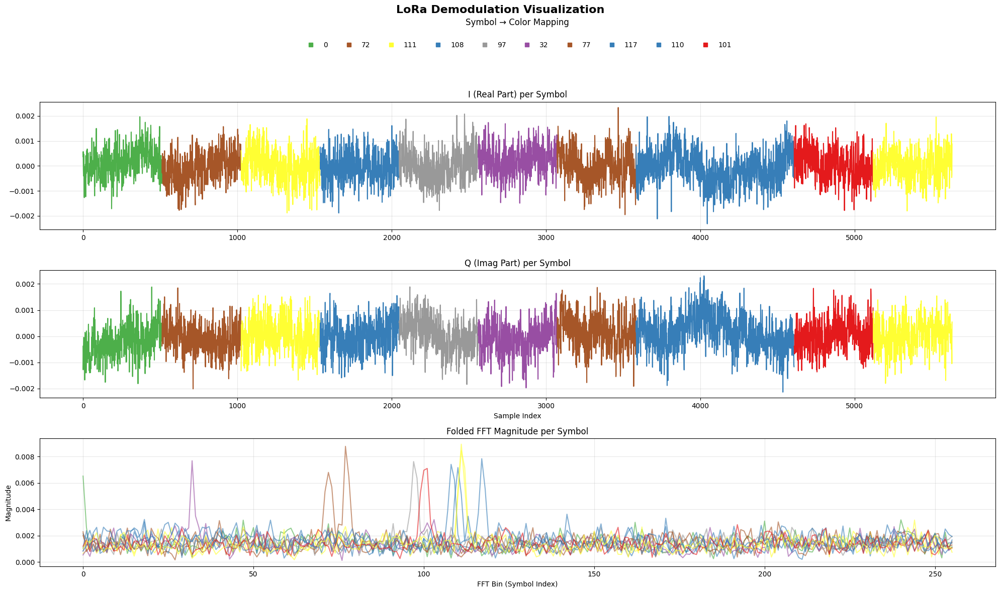

Expected:  [0, 72, 111, 108, 97, 32, 77, 117, 110, 100, 111]
Received:  [  0  72 111 108  97  32  77 117 110 101 111]


In [5]:
sub_chip_offset = 1
chip_offset = 38 * phy_params.samples_per_chip
symbol_offset = 10 * phy_params.samples_per_symbol

sync_offset = sub_chip_offset + chip_offset + symbol_offset

received_signal = iq_dump.iq_buffer[sync_offset:]

preamble_signal = received_signal[:10*phy_params.samples_per_symbol]

symbols, viz = demodulator.demodulate(
    preamble_signal,
    return_items=["symbols", "viz_bundle"])

plot_demodulation(viz)

sfd_signal = received_signal[10*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)


def _apply_cfo_sfo_correction(iq, cfo_residue: float, sfo_residue: float, phy_params: LoRaPhyParams) -> np.ndarray:
    """Apply CFO/SFO phase compensation."""
    chips = 1 << phy_params.spreading_factor
    sps = chips * phy_params.samples_per_chip
    n = np.arange(iq.shape[0], dtype=np.float64)
    sfo_residue = 0
    cfo_phase = 2.0 * np.pi * cfo_residue * n / chips
    sfo_phase = 2.0 * np.pi * sfo_residue * (n / sps) ** 2 / 2.0
    correction = np.exp(-1j * (cfo_phase + sfo_phase)).astype(iq.dtype, copy=False)
    return iq * correction

received_signal = _apply_cfo_sfo_correction(
    received_signal,
    -0.269756,
    -0.009829,
    phy_params)

sfd_signal = received_signal[10*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)

header_signal = received_signal[int(12.25*phy_params.samples_per_symbol):int((14.25*phy_params.samples_per_symbol))]
symbols, viz = demodulator.demodulate(
    header_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

payload_signal = received_signal[int(14.25*phy_params.samples_per_symbol):int((14.25+len(payload_syms))*phy_params.samples_per_symbol)]
symbols, viz = demodulator.demodulate(
    payload_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

print("Expected: ", payload_syms)
print("Received: ", symbols)


In [6]:
# Carga el iq dump
iq_dump_path = list[0]
iq_dump = misc_utils.load_iq_dump(iq_dump_path)  

phy_params = iq_dump.phy_params
frame_params = iq_dump.frame_params
payload_syms = iq_dump.payload
print(f"Loaded IQ dump from {iq_dump_path}")
print(f"PHY Params: {phy_params}")
print(f"Frame Params: {frame_params}")
print(f"Payload Symbols: {payload_syms}")

modulator = LoRaModulator(
    phy_params=phy_params,
    frame_params=frame_params)

demodulator = LoRaDemodulator(
    phy_params=phy_params,
    fold_mode="CPA",
)

sync = DechirpBasedSynchronizer(
    phy_params=phy_params,
    frame_params=frame_params,
    fold_mode="CPA",
    max_sync_candidates=10,
    logging=True,
    debug=True
)

[DEBUG] Loaded dump: /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-Error_20250730-160950.npz
Loaded IQ dump from /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-Error_20250730-160950.npz
PHY Params: LoRaPhyParams(SF=8, BW=500 kHz, SPC=2)
Frame Params: LoRaFrameParams(preamble=8, explicit_header=True, sync_word=0x00, sync_section_length=14.25 symbols)
Payload Symbols: [0, 72, 111, 108, 97, 32, 77, 117, 110, 100, 111]


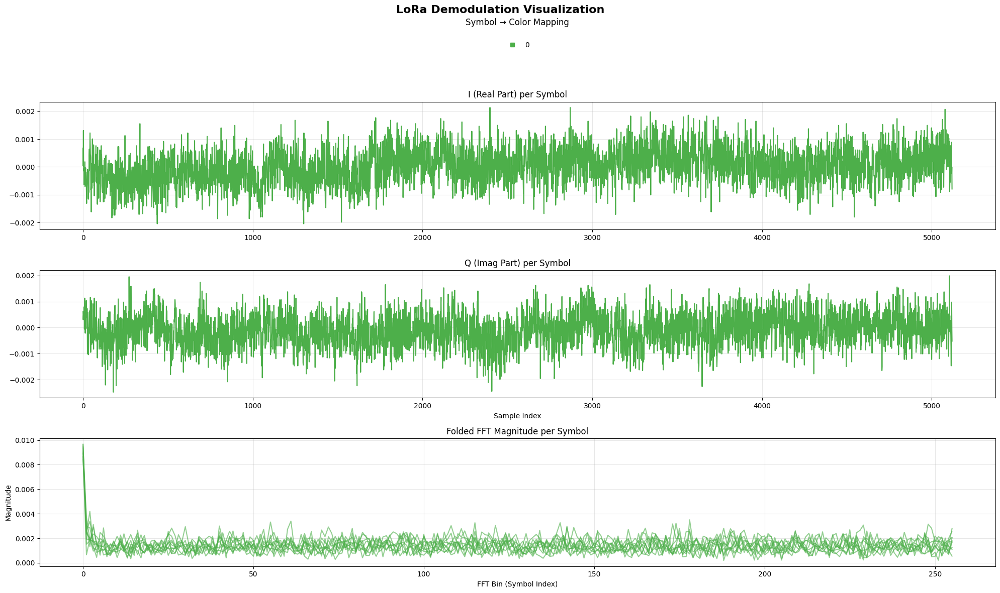

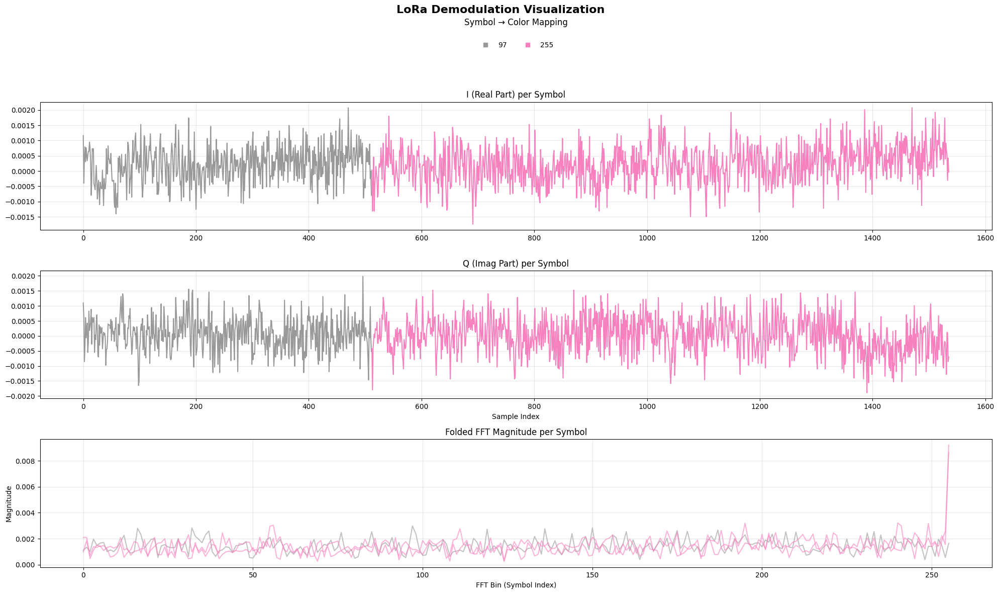

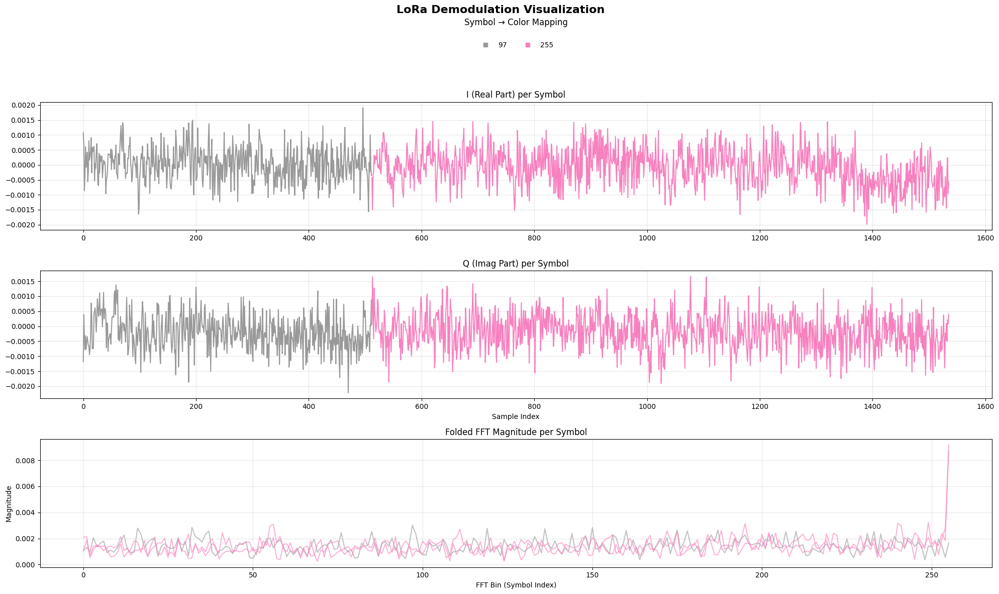

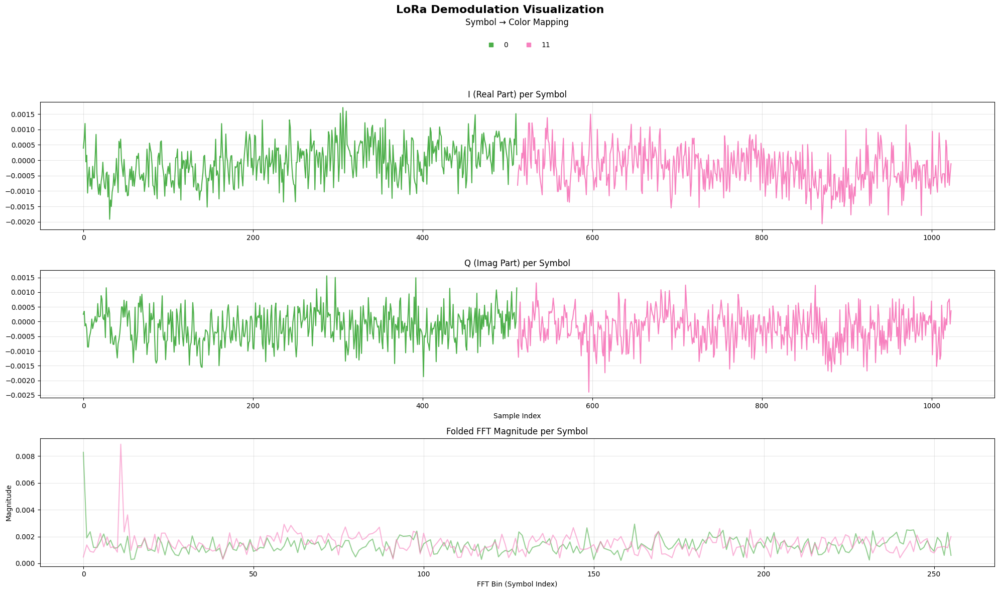

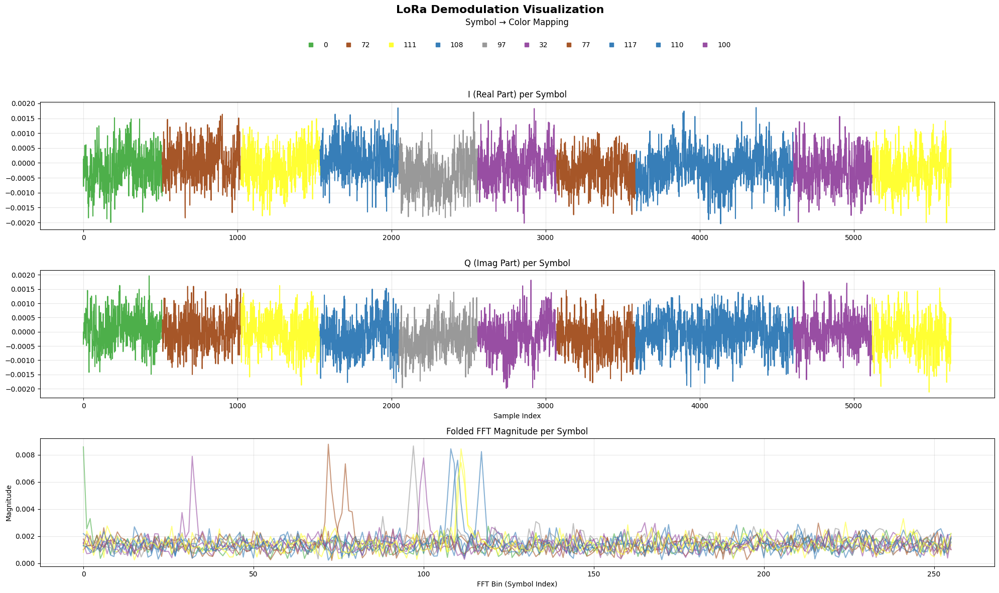

Expected:  [0, 72, 111, 108, 97, 32, 77, 117, 110, 100, 111]
Received:  [  0  72 111 108  97  32  77 117 110 100 111]


In [7]:
sub_chip_offset = 0
chip_offset = 147 * phy_params.samples_per_chip
symbol_offset = 34 * phy_params.samples_per_symbol

sync_offset = sub_chip_offset + chip_offset + symbol_offset

received_signal = iq_dump.iq_buffer[sync_offset-phy_params.samples_per_symbol:]

preamble_signal = received_signal[:10*phy_params.samples_per_symbol]

symbols, viz = demodulator.demodulate(
    preamble_signal,
    return_items=["symbols", "viz_bundle"])

plot_demodulation(viz)

sfd_signal = received_signal[9*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)


def _apply_cfo_sfo_correction(iq, cfo_residue: float, sfo_residue: float, phy_params: LoRaPhyParams) -> np.ndarray:
    """Apply CFO/SFO phase compensation."""
    chips = 1 << phy_params.spreading_factor
    sps = chips * phy_params.samples_per_chip
    n = np.arange(iq.shape[0], dtype=np.float64)
    sfo_residue = 0
    cfo_phase = 2.0 * np.pi * cfo_residue * n / chips
    sfo_phase = 2.0 * np.pi * sfo_residue * (n / sps) ** 2 / 2.0
    correction = np.exp(-1j * (cfo_phase + sfo_phase)).astype(iq.dtype, copy=False)
    return iq * correction

received_signal = _apply_cfo_sfo_correction(
    received_signal,
    0.014070489909499866,
    -0.003394928694303548,
    phy_params)

sfd_signal = received_signal[9*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)

header_signal = received_signal[int(12.25*phy_params.samples_per_symbol):int((14.25*phy_params.samples_per_symbol))]
symbols, viz = demodulator.demodulate(
    header_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

payload_signal = received_signal[int(14.25*phy_params.samples_per_symbol):int((14.25+len(payload_syms))*phy_params.samples_per_symbol)]
symbols, viz = demodulator.demodulate(
    payload_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

print("Expected: ", payload_syms)
print("Received: ", symbols)


In [8]:
aligned = sync.run(misc_utils.load_iq_dump( list[1] ).iq_buffer)

[DEBUG] Loaded dump: /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-Error_20250730-160940.npz
[DechirpBasedSync - run] Found 4 candidates for synchronization.
[DechirpBasedSync - run] Candidate: RunCandidate(row=0, col=36, len=10, sym=46, run_score=0.01, total_score=1.00)
[DechirpBasedSync - run] Candidate: RunCandidate(row=0, col=11, len=10, sym=238, run_score=0.01, total_score=0.58)
[DechirpBasedSync - run] Candidate: RunCandidate(row=1, col=36, len=10, sym=46, run_score=0.01, total_score=0.44)
[DechirpBasedSync - run] Candidate: RunCandidate(row=1, col=11, len=10, sym=238, run_score=0.01, total_score=0.30)
[DechirpBasedSync - run] Processing candidate 1/4
[DechirpBasedSync - run] CFO/SFO residues: -0.03792381879369107, 0.004216338843911043
[check_sfd] (0,0) pair at symbol indices 5120&5632, score=0.008
[DechirpBasedSync - run] Downchirp pair found up to index 6271
[DechirpBasedSync - run] Header length: 1024 samples. Starts at 6272 samples from sync_offset 18524

[DEBUG] Loaded dump: /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-Error_20250730-160940.npz


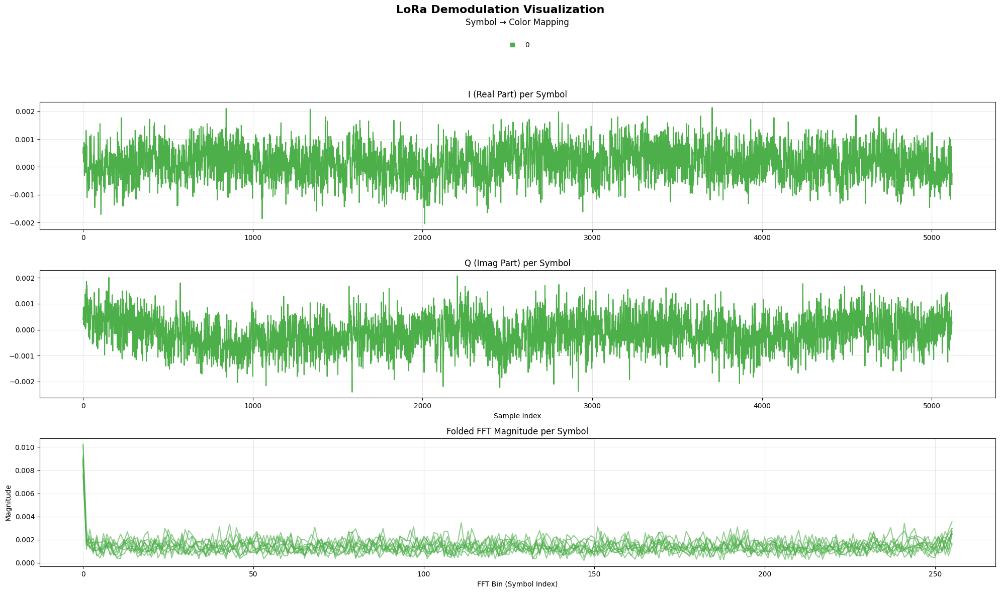

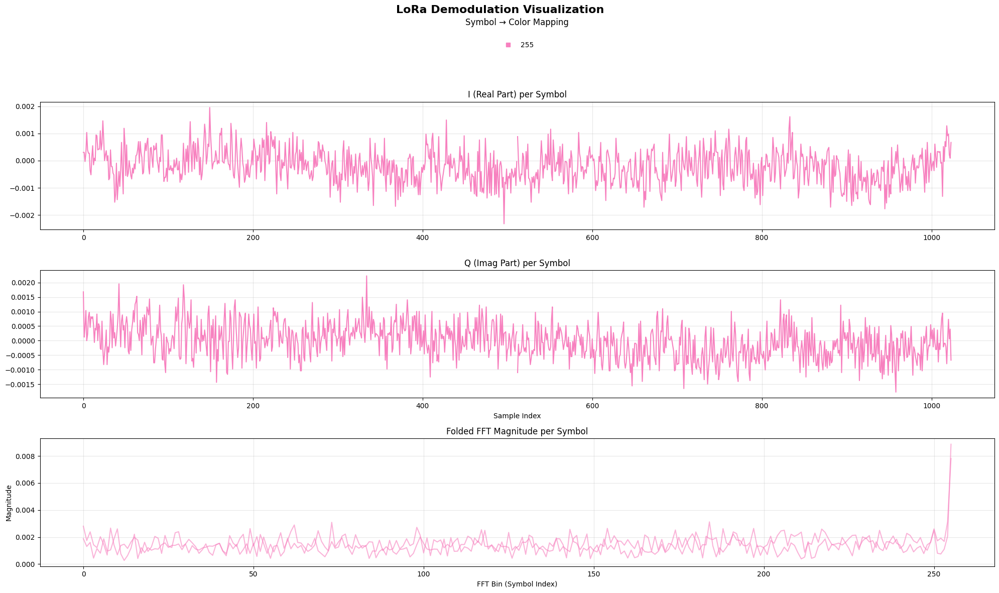

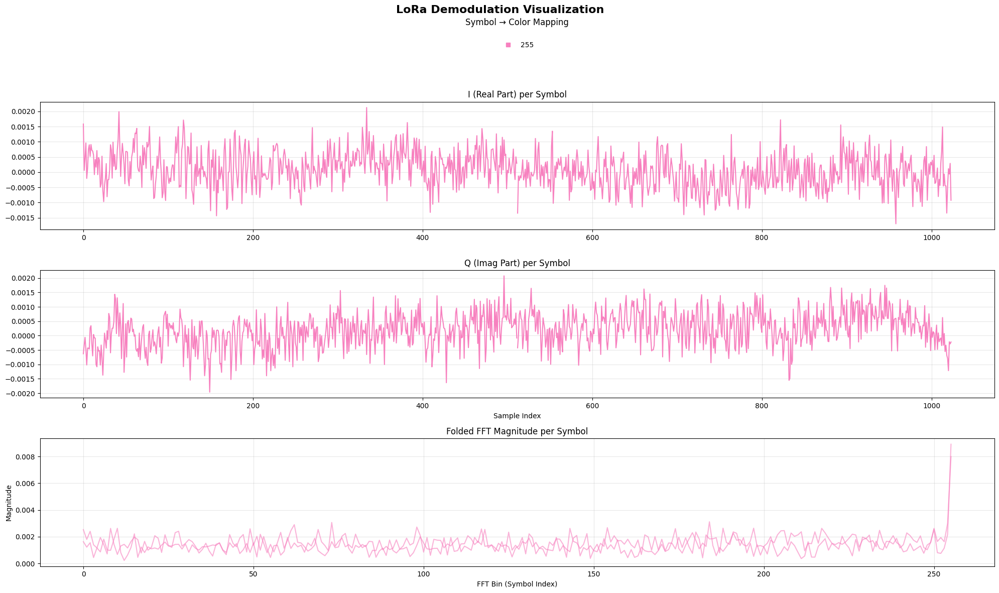

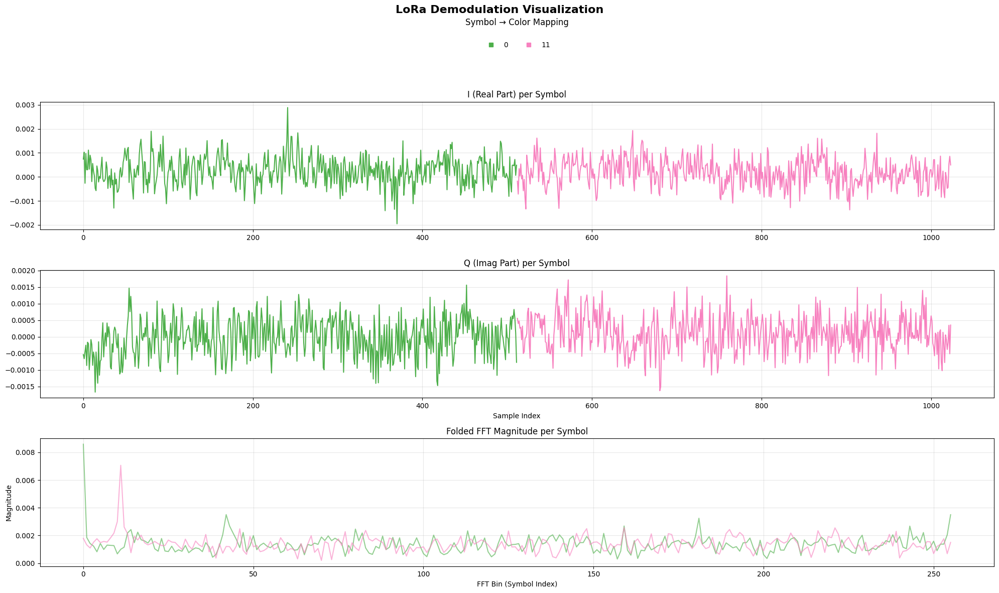

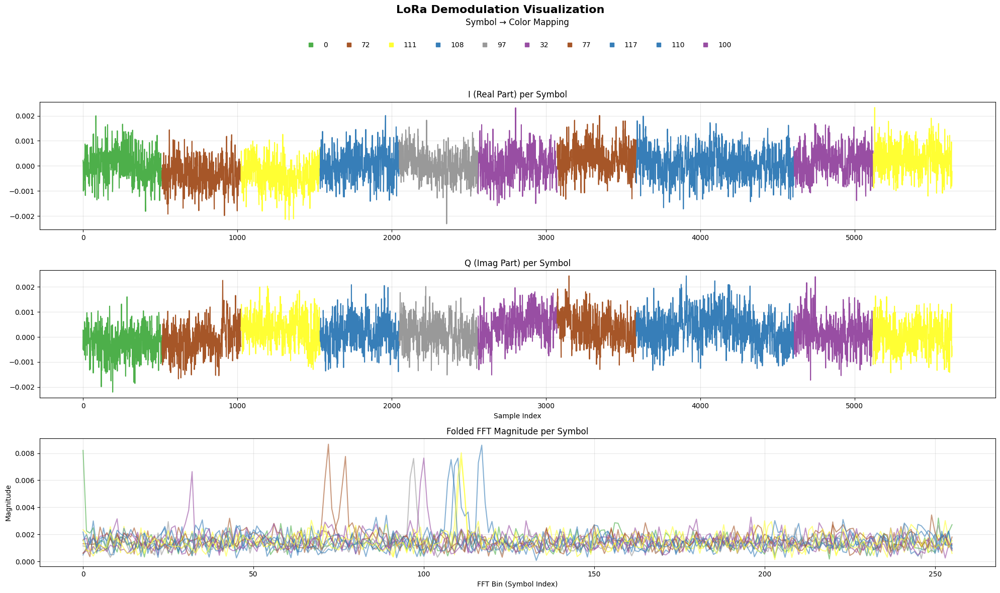

Expected:  [0, 72, 111, 108, 97, 32, 77, 117, 110, 100, 111]
Received:  [  0  72 111 108  97  32  77 117 110 100 111]


In [9]:
iq_dump = misc_utils.load_iq_dump( list[1] )

sub_chip_offset = 0
chip_offset = 46 * phy_params.samples_per_chip
symbol_offset = 36 * phy_params.samples_per_symbol

sync_offset = sub_chip_offset + chip_offset + symbol_offset

received_signal = iq_dump.iq_buffer[sync_offset:]

preamble_signal = received_signal[:10*phy_params.samples_per_symbol]

symbols, viz = demodulator.demodulate(
    preamble_signal,
    return_items=["symbols", "viz_bundle"])

plot_demodulation(viz)

sfd_signal = received_signal[10*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)


def _apply_cfo_sfo_correction(iq, cfo_residue: float, sfo_residue: float, phy_params: LoRaPhyParams) -> np.ndarray:
    """Apply CFO/SFO phase compensation."""
    chips = 1 << phy_params.spreading_factor
    sps = chips * phy_params.samples_per_chip
    n = np.arange(iq.shape[0], dtype=np.float64)
    sfo_residue = 0
    cfo_phase = 2.0 * np.pi * cfo_residue * n / chips
    sfo_phase = 2.0 * np.pi * sfo_residue * (n / sps) ** 2 / 2.0
    correction = np.exp(-1j * (cfo_phase + sfo_phase)).astype(iq.dtype, copy=False)
    return iq * correction

received_signal = _apply_cfo_sfo_correction(
    received_signal,
    0.014070489909499866,
    -0.003394928694303548,
    phy_params)

sfd_signal = received_signal[10*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)

header_signal = received_signal[int(12.25*phy_params.samples_per_symbol):int((14.25*phy_params.samples_per_symbol))]
symbols, viz = demodulator.demodulate(
    header_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

payload_signal = received_signal[int(14.25*phy_params.samples_per_symbol):int((14.25+len(payload_syms))*phy_params.samples_per_symbol)]
symbols, viz = demodulator.demodulate(
    payload_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

print("Expected: ", payload_syms)
print("Received: ", symbols)


In [10]:
aligned = sync.run(misc_utils.load_iq_dump( list[2] ).iq_buffer)

[DEBUG] Loaded dump: /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-Error_20250730-160916.npz
[DechirpBasedSync - run] Found 5 candidates for synchronization.
[DechirpBasedSync - run] Candidate: RunCandidate(row=1, col=52, len=10, sym=214, run_score=0.01, total_score=1.00)
[DechirpBasedSync - run] Candidate: RunCandidate(row=0, col=1, len=10, sym=86, run_score=0.01, total_score=0.66)
[DechirpBasedSync - run] Candidate: RunCandidate(row=0, col=52, len=10, sym=214, run_score=0.01, total_score=0.60)
[DechirpBasedSync - run] Candidate: RunCandidate(row=1, col=27, len=10, sym=150, run_score=0.01, total_score=0.38)
[DechirpBasedSync - run] Candidate: RunCandidate(row=1, col=1, len=9, sym=86, run_score=0.01, total_score=0.27)
[DechirpBasedSync - run] Processing candidate 1/5
[DechirpBasedSync - run] CFO/SFO residues: 0.05067014104376234, 0.005748725252314691
[check_sfd] (0,0) pair at symbol indices 4608&5120, score=0.009
[DechirpBasedSync - run] Downchirp pair found up to

[DEBUG] Loaded dump: /home/fernando/Documents/LoRaPriv/debug_iq_dumps/dump_Dual-SDR-Test-Error_20250730-160916.npz


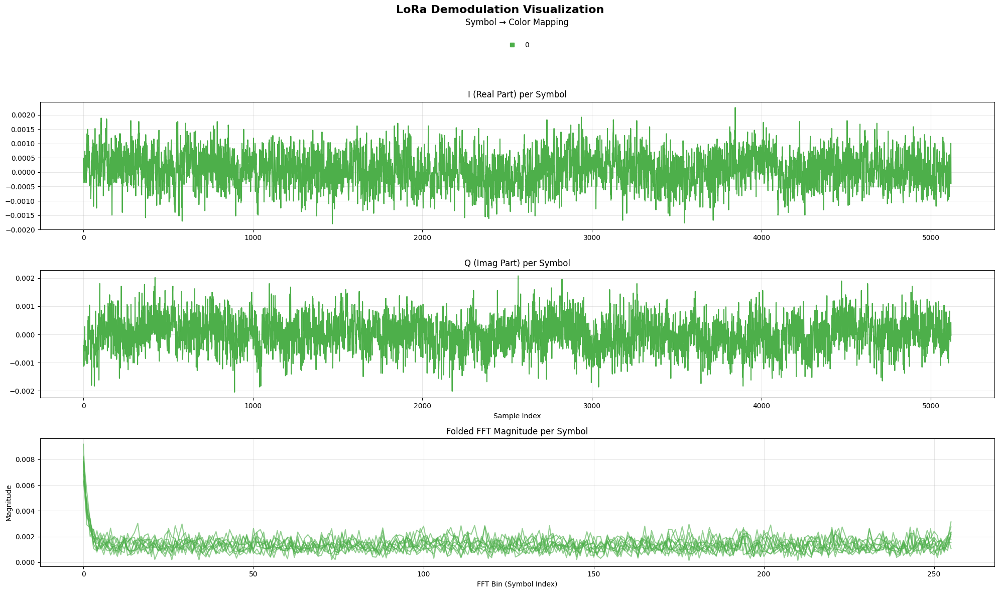

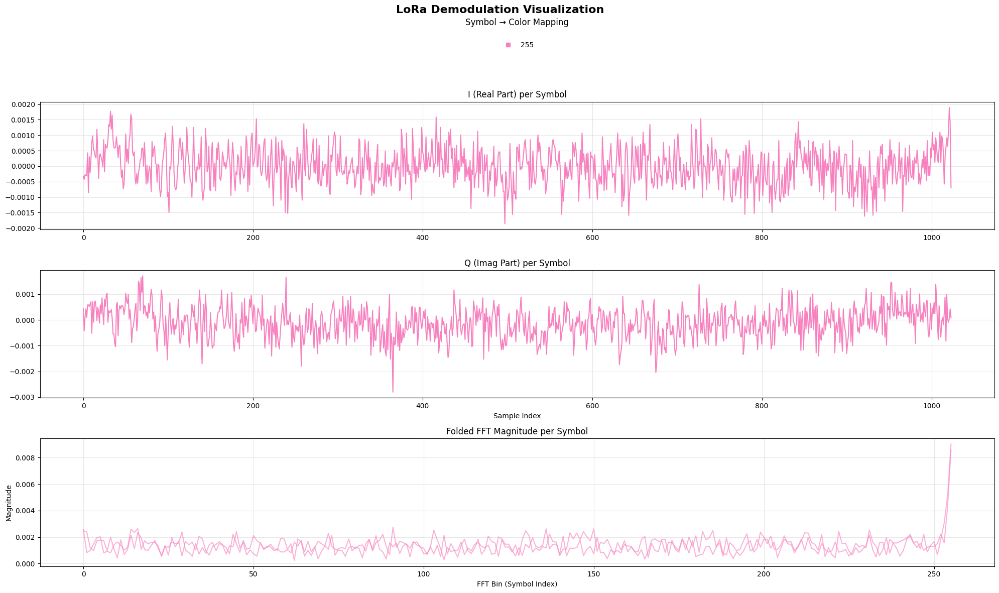

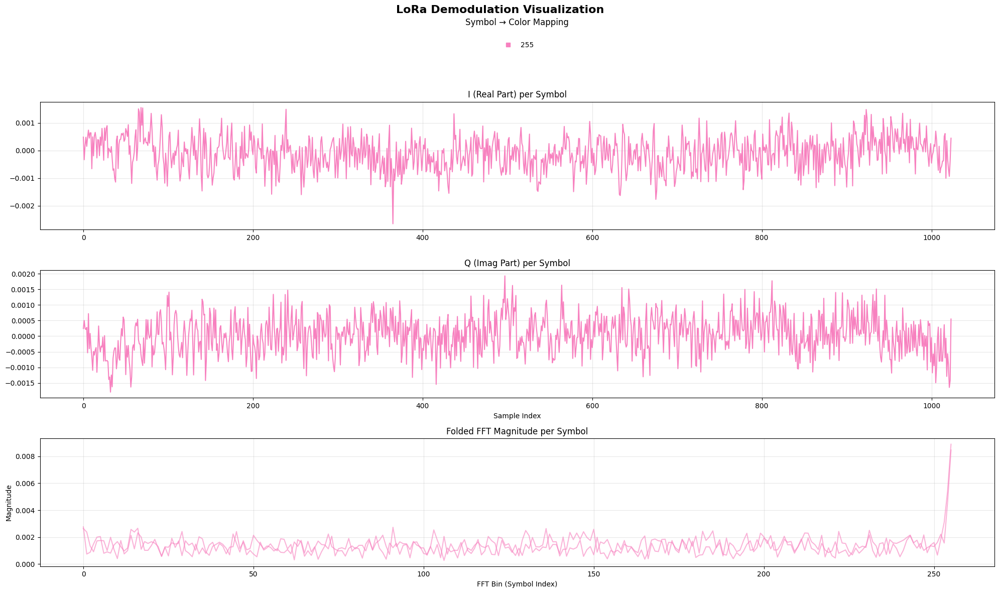

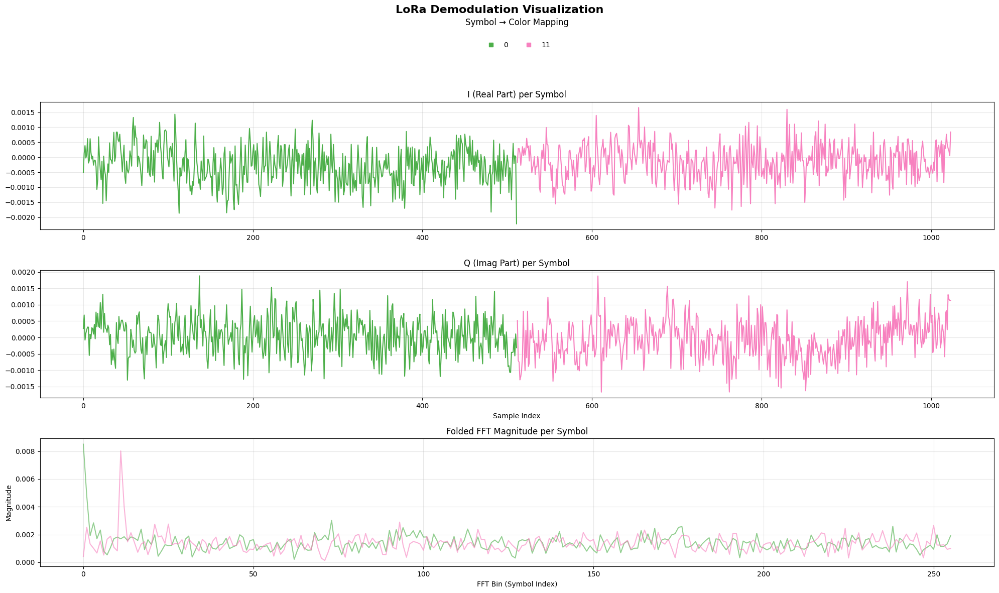

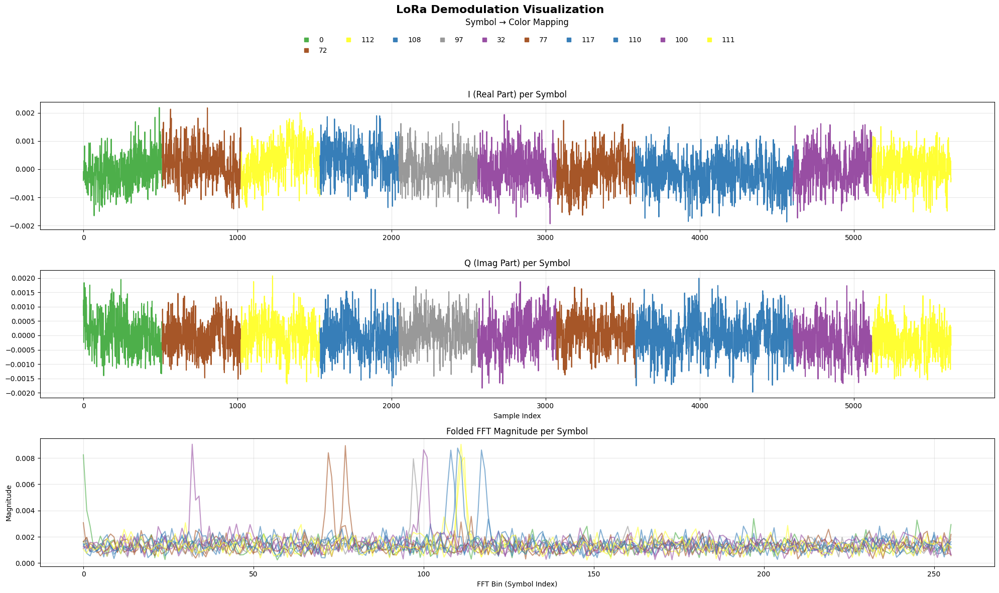

Expected:  [0, 72, 111, 108, 97, 32, 77, 117, 110, 100, 111]
Received:  [  0  72 112 108  97  32  77 117 110 100 111]


In [11]:
iq_dump = misc_utils.load_iq_dump( list[2] )

sub_chip_offset = 1
chip_offset = 86 * phy_params.samples_per_chip
symbol_offset = 1 * phy_params.samples_per_symbol

sync_offset = sub_chip_offset + chip_offset + symbol_offset

received_signal = iq_dump.iq_buffer[sync_offset:]

preamble_signal = received_signal[:10*phy_params.samples_per_symbol]

symbols, viz = demodulator.demodulate(
    preamble_signal,
    return_items=["symbols", "viz_bundle"])

plot_demodulation(viz)

sfd_signal = received_signal[10*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)


def _apply_cfo_sfo_correction(iq, cfo_residue: float, sfo_residue: float, phy_params: LoRaPhyParams) -> np.ndarray:
    """Apply CFO/SFO phase compensation."""
    chips = 1 << phy_params.spreading_factor
    sps = chips * phy_params.samples_per_chip
    n = np.arange(iq.shape[0], dtype=np.float64)
    sfo_residue = 0
    cfo_phase = 2.0 * np.pi * cfo_residue * n / chips
    sfo_phase = 2.0 * np.pi * sfo_residue * (n / sps) ** 2 / 2.0
    correction = np.exp(-1j * (cfo_phase + sfo_phase)).astype(iq.dtype, copy=False)
    return iq * correction

received_signal = _apply_cfo_sfo_correction(
    received_signal,
    0.014070489909499866,
    -0.003394928694303548,
    phy_params)

sfd_signal = received_signal[10*phy_params.samples_per_symbol:12*phy_params.samples_per_symbol]
symbols, viz = demodulator.demodulate(
    sfd_signal,
    return_items=["symbols", "viz_bundle"],
    base = "upchirp")

plot_demodulation(viz)

header_signal = received_signal[int(12.25*phy_params.samples_per_symbol):int((14.25*phy_params.samples_per_symbol))]
symbols, viz = demodulator.demodulate(
    header_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

payload_signal = received_signal[int(14.25*phy_params.samples_per_symbol):int((14.25+len(payload_syms))*phy_params.samples_per_symbol)]
symbols, viz = demodulator.demodulate(
    payload_signal,
    return_items=["symbols", "viz_bundle"],
    base = "downchirp")
plot_demodulation(viz)

print("Expected: ", payload_syms)
print("Received: ", symbols)
